# Installasi

In [ ]:
!pip install mediapipe==0.10.35 scikit-image==0.25.2 scikit-learn==1.6.1 scipy opencv-python-headless joblib -q
print('✅ Instalasi selesai')

✅ Instalasi selesai


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import cv2
import joblib
from pathlib import Path
from PIL import Image
from scipy.signal import wiener
from skimage.color import rgb2lab
from collections import defaultdict
from datetime import datetime

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import (
    silhouette_score, davies_bouldin_score,
    confusion_matrix, classification_report,
    f1_score, accuracy_score
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from scipy.optimize import linear_sum_assignment

warnings.filterwarnings('ignore')
sns.set_theme(style='whitegrid', palette='muted')
plt.rcParams['figure.dpi'] = 120

import urllib.request
from mediapipe.tasks import python as mp_tasks
from mediapipe.tasks.python import vision as mp_vision
import mediapipe as mp_lib

# Download model MediaPipe sekali
_MP_MODEL_PATH = '/content/face_landmarker.task'
if not os.path.exists(_MP_MODEL_PATH):
    urllib.request.urlretrieve(
        'https://storage.googleapis.com/mediapipe-models/face_landmarker/face_landmarker/float16/1/face_landmarker.task',
        _MP_MODEL_PATH
    )

_mp_options = mp_vision.FaceLandmarkerOptions(
    base_options=mp_tasks.BaseOptions(model_asset_path=_MP_MODEL_PATH),
    num_faces=1,
    min_face_detection_confidence=0.3,
    min_face_presence_confidence=0.3,
    min_tracking_confidence=0.3,
)
FACE_MESH = mp_vision.FaceLandmarker.create_from_options(_mp_options)

# MediaPipe Face Mesh index
MP_LANDMARK_MAP = {
    0:  234,   # jaw far left
    1:  227,   # jaw left
    8:  152,   # chin bottom
    15: 447,   # jaw right
    16: 454,   # jaw far right
    17: 70,    # left brow outer
    18: 63,
    19: 66,    # left brow mid
    20: 65,
    21: 55,
    22: 285,
    23: 295,
    24: 282,
    25: 283,
    26: 296,   # right brow outer
    27: 168,   # nose bridge top
    28: 6,
    29: 197,
    30: 195,
    31: 5,
    32: 4,
    33: 1,
    34: 19,
    35: 94,    # nose tip
}

print('library loaded')
print(f'   mediapipe: {mp_lib.__version__}')
print(f'   OpenCV   : {cv2.__version__}')

library loaded
   mediapipe: 0.10.35
   OpenCV   : 4.13.0


In [ ]:
DATASET_ROOT   = '/content/drive/MyDrive/Capstone/mst-e_data/mst-e_data'
CSV_PATH       = os.path.join(DATASET_ROOT, 'mst-e_image_details.csv')
GOLD_CSV_PATH  = os.path.join(DATASET_ROOT, 'golden_and_adversarial_mst-e_image_ids.csv')
MODEL_DIR      = '/content/drive/MyDrive/Capstone/models'
FEAT_CSV       = '/content/drive/MyDrive/Capstone/cielab_features.csv'
FOUNDATION_CSV = '/content/drive/MyDrive/Capstone/foundation data/foundation_mst_full_most_updated.csv'

MST_COL      = 'MST'
POSE_COL     = 'pose'
LIGHTING_COL = 'lighting'
SUBJECT_COL  = 'subject_name'
IMAGE_COL    = 'image_ID'

os.makedirs(MODEL_DIR, exist_ok=True)

print('Dataset root exists:', os.path.exists(DATASET_ROOT))
print('CSV path exists    :', os.path.exists(CSV_PATH))
print('✅ Semua path & konstanta siap')

Dataset root exists: True
CSV path exists    : True
✅ Semua path & konstanta siap


# Checking

In [ ]:
df = pd.read_csv(CSV_PATH)

print(f'Shape: {df.shape}')
print(f'Kolom: {df.columns.tolist()}')

df.head(10)

Shape: (1546, 6)
Kolom: ['image_ID', 'pose', 'lighting', 'mask', 'subject_name', 'MST']


,image_ID,pose,lighting,mask,subject_name,MST
0,PXL_20220922_183640936.PORTRAIT.jpg,frontal,poorly_lit,0,subject_18,1
1,PXL_20220922_183639710.PORTRAIT.jpg,bottom,poorly_lit,0,subject_18,1
2,PXL_20220922_183638393.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1
3,PXL_20220922_183636542.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1
4,PXL_20220922_183634690.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1
5,PXL_20220922_183627117.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1
6,PXL_20220922_183621991.PORTRAIT.jpg,side,poorly_lit,0,subject_18,1
7,PXL_20220922_183620053.PORTRAIT.jpg,facing_camera,well_lit,0,subject_18,1
8,PXL_20220922_183617300.PORTRAIT.jpg,frontal,well_lit,0,subject_18,1
9,PXL_20220922_183616200.PORTRAIT.jpg,bottom,well_lit,0,subject_18,1


In [ ]:
print('=== Info Data Frame ===')
df.info()
print()
print('=== Missing values ===')
print(df.isnull().sum())

=== Info Data Frame ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1546 entries, 0 to 1545
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image_ID      1546 non-null   object
 1   pose          1546 non-null   object
 2   lighting      1546 non-null   object
 3   mask          1546 non-null   object
 4   subject_name  1546 non-null   object
 5   MST           1546 non-null   int64 
dtypes: int64(1), object(5)
memory usage: 72.6+ KB

=== Missing values ===
image_ID        0
pose            0
lighting        0
mask            0
subject_name    0
MST             0
dtype: int64


In [ ]:
for col_name, col_var in [('MST', MST_COL), ('Pose', POSE_COL),
                           ('Lighting', LIGHTING_COL), ('Subject', SUBJECT_COL),
                           ('Image ID', IMAGE_COL)]:
    status = 'True' if col_var in df.columns else 'False'
    print(f'{col_name:12} : "{col_var}" {status}')
print('\nKolom yang tersedia:', df.columns.tolist())

MST          : "MST" True
Pose         : "pose" True
Lighting     : "lighting" True
Subject      : "subject_name" True
Image ID     : "image_ID" True

Kolom yang tersedia: ['image_ID', 'pose', 'lighting', 'mask', 'subject_name', 'MST']


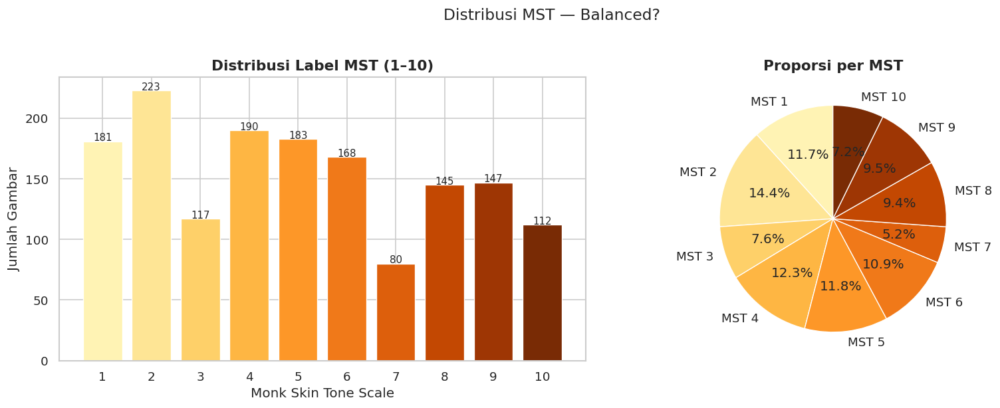


Ringkasan distribusi MST:
MST
1     181
2     223
3     117
4     190
5     183
6     168
7      80
8     145
9     147
10    112

Apakah balanced? Ratio min/max = 0.36


In [ ]:
# Distribusi MST

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

mst_counts = df[MST_COL].value_counts().sort_index()
colors_bar = plt.cm.YlOrBr(np.linspace(0.15, 0.95, 10))

axes[0].bar(mst_counts.index, mst_counts.values, color=colors_bar, edgecolor='white', linewidth=0.8)
axes[0].set_title('Distribusi Label MST (1–10)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Monk Skin Tone Scale')
axes[0].set_ylabel('Jumlah Gambar')
axes[0].set_xticks(range(1, 11))
for i, v in enumerate(mst_counts.values):
    axes[0].text(mst_counts.index[i], v + 0.5, str(v), ha='center', fontsize=9)

axes[1].pie(mst_counts.values, labels=[f'MST {i}' for i in mst_counts.index],
            autopct='%1.1f%%', colors=colors_bar, startangle=90,
            wedgeprops={'edgecolor': 'white', 'linewidth': 0.8})
axes[1].set_title('Proporsi per MST', fontsize=13, fontweight='bold')

plt.suptitle('Distribusi MST — Balanced?', fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('/content/distribusi_mst.png', bbox_inches='tight')
plt.show()

print('\nRingkasan distribusi MST:')
print(mst_counts.to_string())
print(f'\nApakah balanced? Ratio min/max = {mst_counts.min()/mst_counts.max():.2f}')

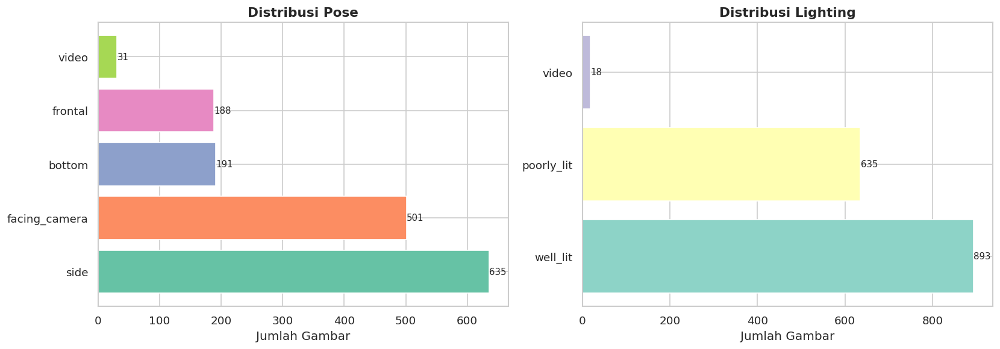

In [ ]:
# Distribusi pose & lighting

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

pose_counts = df[POSE_COL].value_counts()
axes[0].barh(pose_counts.index, pose_counts.values, color=sns.color_palette('Set2', len(pose_counts)))
axes[0].set_title('Distribusi Pose', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Jumlah Gambar')
for i, v in enumerate(pose_counts.values):
    axes[0].text(v + 0.5, i, str(v), va='center', fontsize=9)

light_counts = df[LIGHTING_COL].value_counts()
axes[1].barh(light_counts.index, light_counts.values, color=sns.color_palette('Set3', len(light_counts)))
axes[1].set_title('Distribusi Lighting', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Jumlah Gambar')
for i, v in enumerate(light_counts.values):
    axes[1].text(v + 0.5, i, str(v), va='center', fontsize=9)

plt.tight_layout()
plt.savefig('/content/distribusi_pose_lighting.png', bbox_inches='tight')
plt.show()

## Heatmap

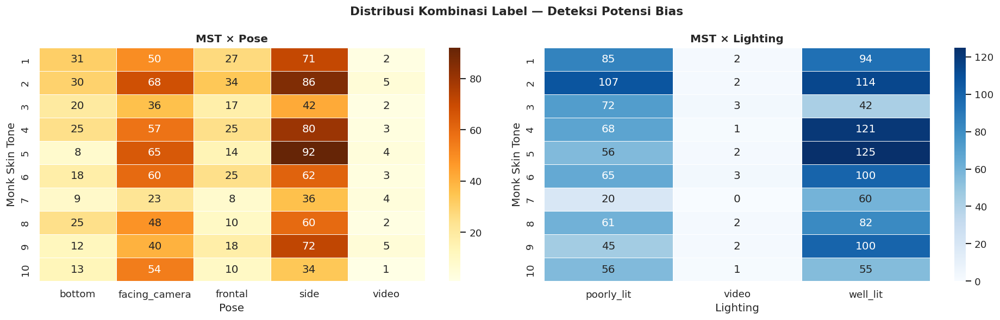

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Heatmap MST × Pose
pivot1 = df.pivot_table(index=MST_COL, columns=POSE_COL, aggfunc='size', fill_value=0)
sns.heatmap(pivot1, annot=True, fmt='d', cmap='YlOrBr', ax=axes[0], linewidths=0.5)
axes[0].set_title('MST × Pose', fontsize=12, fontweight='bold')
axes[0].set_xlabel('Pose')
axes[0].set_ylabel('Monk Skin Tone')

# Heatmap MST × Lighting
pivot2 = df.pivot_table(index=MST_COL, columns=LIGHTING_COL, aggfunc='size', fill_value=0)
sns.heatmap(pivot2, annot=True, fmt='d', cmap='Blues', ax=axes[1], linewidths=0.5)
axes[1].set_title('MST × Lighting', fontsize=12, fontweight='bold')
axes[1].set_xlabel('Lighting')
axes[1].set_ylabel('Monk Skin Tone')

plt.suptitle('Distribusi Kombinasi Label — Deteksi Potensi Bias', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/heatmap_kombinasi.png', bbox_inches='tight')
plt.show()

## Distribusi Image per Subjek

['image_ID', 'pose', 'lighting', 'mask', 'subject_name', 'MST']


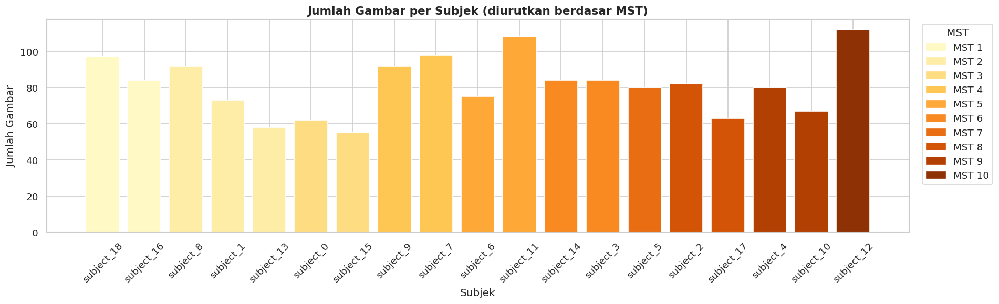

In [ ]:
print(df.columns.tolist())

subj_mst = df.groupby(SUBJECT_COL)[MST_COL].first().reset_index()
subj_count = df[SUBJECT_COL].value_counts().reset_index()
subj_count.columns = [SUBJECT_COL, 'count']
subj_count = subj_count.merge(subj_mst, on=SUBJECT_COL)
subj_count = subj_count.sort_values(MST_COL)

fig, ax = plt.subplots(figsize=(16, 5))
colors_subj = plt.cm.YlOrBr(np.linspace(0.1, 0.9, 10))
bar_colors = [colors_subj[int(m)-1] for m in subj_count[MST_COL]]
ax.bar(subj_count[SUBJECT_COL], subj_count['count'], color=bar_colors, edgecolor='white')
ax.set_title('Jumlah Gambar per Subjek (diurutkan berdasar MST)', fontsize=13, fontweight='bold')
ax.set_xlabel('Subjek')
ax.set_ylabel('Jumlah Gambar')
ax.tick_params(axis='x', rotation=45)

# Legend
legend_patches = [mpatches.Patch(color=colors_subj[i], label=f'MST {i+1}') for i in range(10)]
ax.legend(handles=legend_patches, title='MST', bbox_to_anchor=(1.01, 1), loc='upper left', ncol=1)

plt.tight_layout()
plt.savefig('/content/gambar_per_subjek.png', bbox_inches='tight')
plt.show()

## Stratified Sampling Gambar

In [ ]:
N_SAMPLE_PER_MST = 5  # jumlah sampel per kategori MST

# Filter dengan gambar lighting 'Well Lit'
df_welllit = df[df[LIGHTING_COL].str.lower().str.contains('well', na=False)]

# Stratified sampling
df_sample = (
    df_welllit.groupby(MST_COL, group_keys=False)
    .apply(lambda x: x.sample(min(N_SAMPLE_PER_MST, len(x)), random_state=42))
    .reset_index(drop=True)
)

print(f'Total sampel: {len(df_sample)} gambar')
print('Distribusi per MST:')
print(df_sample[MST_COL].value_counts().sort_index().to_string())


Total sampel: 50 gambar
Distribusi per MST:
MST
1     5
2     5
3     5
4     5
5     5
6     5
7     5
8     5
9     5
10    5


Contoh path: /content/drive/MyDrive/Capstone/mst-e_data/mst-e_data/subject_18/PXL_20220922_182647374.jpg
File exist : True
Berhasil load gambar, shape: (512, 385, 3)


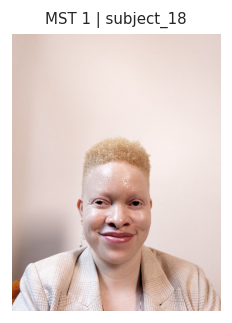

In [ ]:
def get_image_path(row):
    subject = str(row[SUBJECT_COL]).lower().replace(' ', '_')  # misal: 'subject_5'
    image_id = str(row[IMAGE_COL])
    path = os.path.join(DATASET_ROOT, subject, image_id)
    return path

def load_image(path, max_size=512):
    """Load gambar"""
    try:
        img = cv2.imread(path)
        if img is None:
            return None
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        if max(h, w) > max_size:
            scale = max_size / max(h, w)
            img = cv2.resize(img, (int(w*scale), int(h*scale)))
        return img
    except Exception as e:
        return None

# Test load satu gambar
test_row = df_sample.iloc[0]
test_path = get_image_path(test_row)
print(f'Contoh path: {test_path}')
print(f'File exist : {os.path.exists(test_path)}')

test_img = load_image(test_path)
if test_img is not None:
    print(f'Berhasil load gambar, shape: {test_img.shape}')
    plt.figure(figsize=(3, 3))
    plt.imshow(test_img)
    plt.title(f"MST {test_row[MST_COL]} | {test_row[SUBJECT_COL]}", fontsize=9)
    plt.axis('off')
    plt.show()
else:
    print('Gagal load gambar — cek path & struktur folder')

# Visual EDA

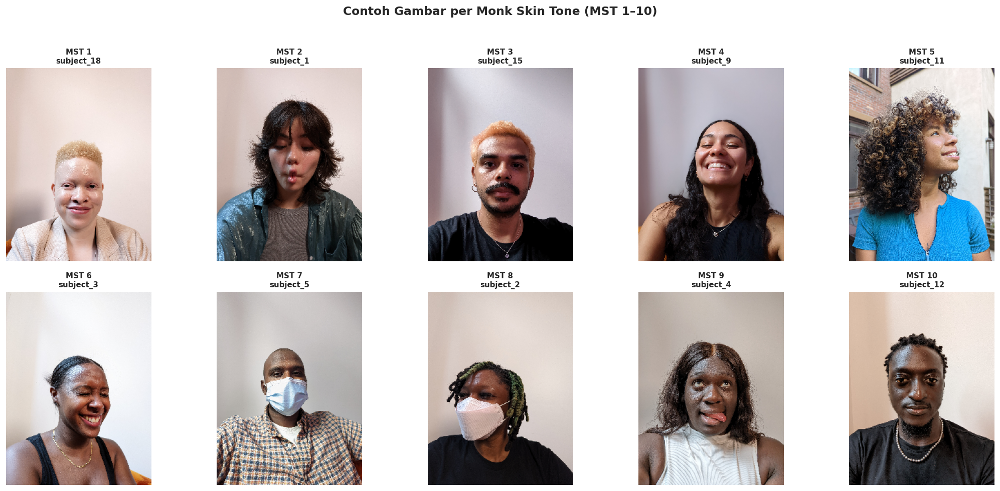

10/10 gambar berhasil ditampilkan


In [ ]:
# Tampilkan 1 gambar per MST (10 kategori)
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
axes = axes.flatten()

loaded_count = 0
for mst_val in range(1, 11):
    subset = df_sample[df_sample[MST_COL] == mst_val]
    ax = axes[mst_val - 1]

    img_loaded = False
    for _, row in subset.iterrows():
        path = get_image_path(row)
        img = load_image(path, max_size=300)
        if img is not None:
            ax.imshow(img)
            ax.set_title(f'MST {mst_val}\n{row[SUBJECT_COL]}', fontsize=9, fontweight='bold')
            ax.axis('off')
            img_loaded = True
            loaded_count += 1
            break

    if not img_loaded:
        ax.text(0.5, 0.5, f'MST {mst_val}\n(tidak ditemukan)', ha='center', va='center',
                transform=ax.transAxes, fontsize=10, color='red')
        ax.axis('off')

plt.suptitle('Contoh Gambar per Monk Skin Tone (MST 1–10)', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/content/contoh_per_mst.png', bbox_inches='tight')
plt.show()
print(f'{loaded_count}/10 gambar berhasil ditampilkan')

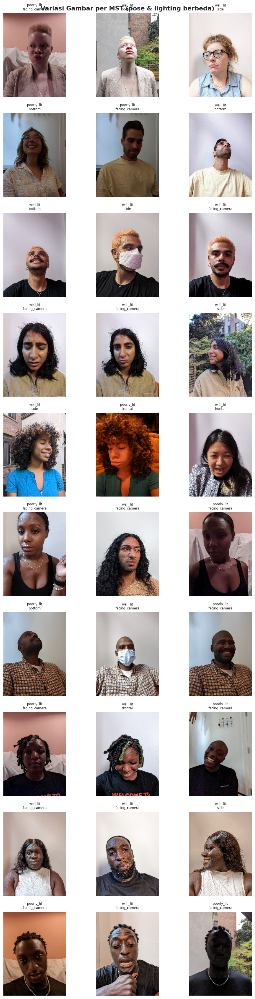

In [ ]:
# Tampilkan 3 gambar per MST dengan kondisi lighting berbeda
N_SHOW = 3
fig, axes = plt.subplots(10, N_SHOW, figsize=(N_SHOW*3, 10*3))

for mst_val in range(1, 11):
    subset = df[df[MST_COL] == mst_val].sample(min(N_SHOW, len(df[df[MST_COL] == mst_val])),
                                                random_state=42)
    for j in range(N_SHOW):
        ax = axes[mst_val-1][j]
        if j < len(subset):
            row = subset.iloc[j]
            path = get_image_path(row)
            img = load_image(path, max_size=200)
            if img is not None:
                ax.imshow(img)
                ax.set_title(f"{row.get(LIGHTING_COL, '')}\n{row.get(POSE_COL, '')}",
                             fontsize=7)
            else:
                ax.text(0.5, 0.5, 'N/A', ha='center', va='center',
                        transform=ax.transAxes, color='gray')
        ax.axis('off')
        if j == 0:
            ax.set_ylabel(f'MST {mst_val}', fontsize=10, fontweight='bold', rotation=0,
                          labelpad=60, va='center')

plt.suptitle('Variasi Gambar per MST (pose & lighting berbeda)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/variasi_per_mst.png', bbox_inches='tight')
plt.show()

# Processing

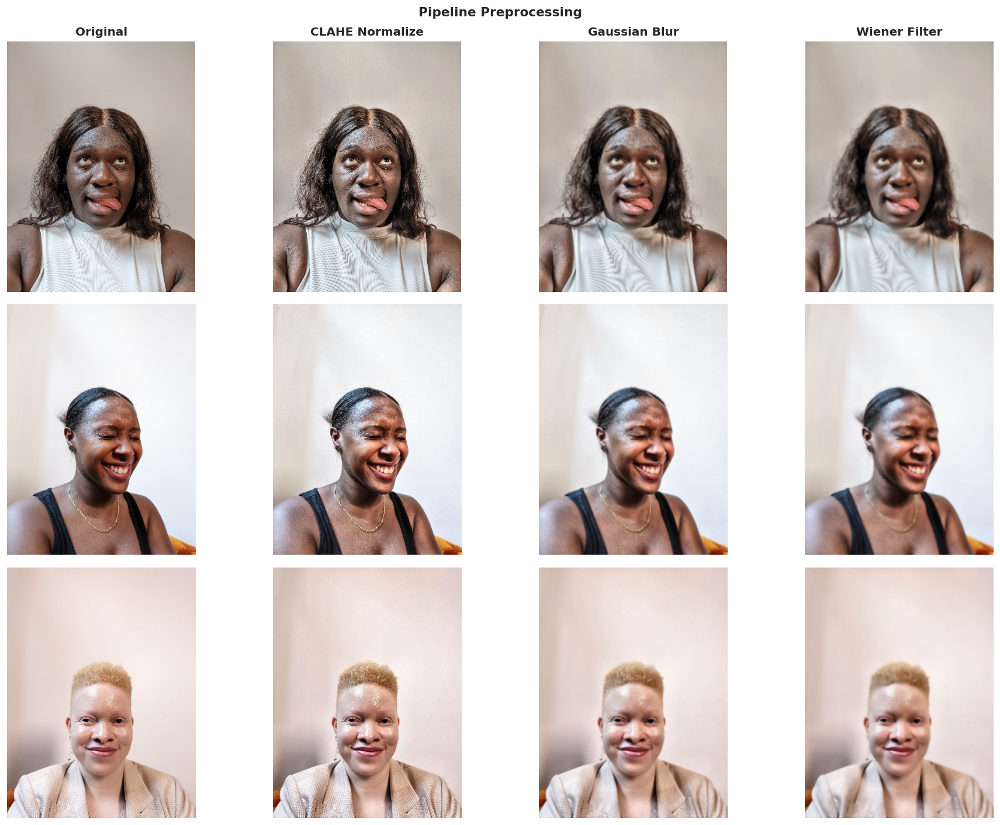

In [ ]:
def normalize_image(img):
    """CLAHE ringan — hanya untuk pemerataan, bukan amplifikasi besar."""
    lab   = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(16, 16))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

def gaussian_blur(img, ksize=5, sigma=1.0):
    return cv2.GaussianBlur(img, (ksize, ksize), sigma)

def wiener_filter(img, mysize=5):
    """Wiener filter per channel RGB."""
    result = np.zeros_like(img, dtype=np.float32)
    for c in range(3):
        result[:, :, c] = wiener(img[:, :, c].astype(np.float32), mysize=mysize)
    return np.clip(result, 0, 255).astype(np.uint8)

def preprocess_image(img):
    """Pipeline: normalize → blur → wiener."""
    return wiener_filter(gaussian_blur(normalize_image(img)))

# Visualisasi pipeline
N_PREVIEW = 3
df_pv = df_sample.groupby(MST_COL).first().reset_index().sample(N_PREVIEW, random_state=7)
fig, axes = plt.subplots(N_PREVIEW, 4, figsize=(16, N_PREVIEW*4))
steps = ['Original', 'CLAHE Normalize', 'Gaussian Blur', 'Wiener Filter']

for r, (_, row) in enumerate(df_pv.iterrows()):
    img = load_image(get_image_path(row))
    if img is None: continue
    norm  = normalize_image(img)
    gauss = gaussian_blur(norm)
    wien  = wiener_filter(gauss)
    for c, (im, title) in enumerate(zip([img, norm, gauss, wien], steps)):
        axes[r][c].imshow(im)
        if r == 0: axes[r][c].set_title(title, fontweight='bold')
        if c == 0: axes[r][c].set_ylabel(f'MST {row[MST_COL]}', fontsize=9)
        axes[r][c].axis('off')

plt.suptitle('Pipeline Preprocessing', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/preprocessing.png', bbox_inches='tight')
plt.show()

In [ ]:
# Computer Vision: Landmark + ROI + Fitur

import math

def detect_landmarks_dlib(img):
    """
    Deteksi landmark wajah menggunakan MediaPipe Face Mesh.
    Return format sama dengan versi dlib: (list of (x,y) tuples, bbox_namedtuple)
    sehingga semua kode downstream tidak perlu diubah.
    """
    h, w = img.shape[:2]
    # Pastikan 3 channel
    if img.ndim == 3 and img.shape[2] == 4:
        img = img[:, :, :3]
    mp_image = mp_lib.Image(image_format=mp_lib.ImageFormat.SRGB, data=img)
    results  = FACE_MESH.detect(mp_image)
    if not results.face_landmarks:
        return None, None

    mp_lms = results.face_landmarks[0]

    lms = {}
    for dlib_idx, mp_idx in MP_LANDMARK_MAP.items():
        pt = mp_lms[mp_idx]
        lms[dlib_idx] = (int(pt.x * w), int(pt.y * h))

    # Konversi ke list of tuples (index 0–35) — indeks di luar map → (0,0)
    max_idx = max(MP_LANDMARK_MAP.keys())
    pts = [(0, 0)] * (max_idx + 1)
    for dlib_idx, xy in lms.items():
        pts[dlib_idx] = xy

    # Buat namedtuple bbox agar kompatibel dengan kode visualisasi
    xs = [p[0] for p in lms.values()]
    ys = [p[1] for p in lms.values()]
    from collections import namedtuple
    BBox = namedtuple('BBox', ['left', 'top', 'right', 'bottom'])
    bbox = BBox(min(xs), min(ys), max(xs), max(ys))

    return pts, bbox

def make_zone_mask(img_shape, landmarks, indices):
    h, w = img_shape[:2]
    pts  = np.array([landmarks[i] for i in indices if i < len(landmarks)], dtype=np.int32)
    if len(pts) < 3:
        return np.zeros((h, w), dtype=bool)
    hull = cv2.convexHull(pts)
    mask = np.zeros((h, w), dtype=np.uint8)
    cv2.fillPoly(mask, [hull], 1)
    return mask.astype(bool)

def make_cheek_ellipse_mask(img_shape, landmarks):
    h, w   = img_shape[:2]
    mid_y  = (landmarks[27][1] + landmarks[8][1]) // 2
    face_w = landmarks[16][0] - landmarks[0][0]

    ew, eh = int(face_w * 0.18), int(face_w * 0.13)
    mask   = np.zeros((h, w), dtype=np.uint8)
    cv2.ellipse(mask, (landmarks[1][0] + ew, mid_y), (ew, eh), 0, 0, 360, 1, -1)
    cv2.ellipse(mask, (landmarks[15][0] - ew, mid_y), (ew, eh), 0, 0, 360, 1, -1)
    return mask.astype(bool)

def filter_skin_pixels(lab_pixels, l_min=25, l_max=97, a_min=5, a_max=30, b_min=5, b_max=40):
    """
    Tambahan filter b* (kuning-biru):
    - b_min=5: buang piksel background gelap/netral yang b* rendah
    - b_max=40: batas atas wajar untuk kulit
    - l_min naik 20→25: piksel sangat gelap kemungkinan bukan kulit
    - a_min naik 3→5: background hitam/abu punya a* sangat rendah
    """
    mask = (
        (lab_pixels[:, 0] >= l_min) & (lab_pixels[:, 0] <= l_max) &
        (lab_pixels[:, 1] >= a_min) & (lab_pixels[:, 1] <= a_max) &
        (lab_pixels[:, 2] >= b_min) & (lab_pixels[:, 2] <= b_max)
    )
    return lab_pixels[mask]

def make_forehead_mask(img_shape, landmarks):
    h, w    = img_shape[:2]
    brow_y  = int(np.mean([landmarks[i][1] for i in range(17, 27)]))
    brow_lx = landmarks[17][0]
    brow_rx = landmarks[26][0]
    face_h  = landmarks[8][1] - landmarks[19][1]
    top_y   = max(0, brow_y - int(face_h * 0.35))
    pts  = np.array([[brow_lx, top_y], [brow_rx, top_y],
                     [brow_rx, brow_y], [brow_lx, brow_y]], dtype=np.int32)
    mask = np.zeros((h, w), dtype=np.uint8)
    cv2.fillPoly(mask, [pts], 1)
    return mask.astype(bool)

def compute_ita(L, b):
    """Individual Typology Angle — standar industri untuk skin tone classification."""
    return math.degrees(math.atan2(L - 50, b))

def get_all_skin_features(img, landmarks):
    lab        = rgb2lab(img.astype(np.float64) / 255.0)
    all_pixels = []
    feats      = {}
    zones = {
        'cheek'   : make_cheek_ellipse_mask(img.shape, landmarks),
        'forehead': make_forehead_mask(img.shape, landmarks),
        'nose'    : make_zone_mask(img.shape, landmarks, list(range(27, 36))),
    }
    for zone_name, mask in zones.items():
        if mask.sum() < 10: continue
        px = lab[mask]
        px = filter_skin_pixels(px)
        if len(px) < 5: continue
        all_pixels.append(px)
        for ci, ch in enumerate(['L', 'a', 'b']):
            feats[f'{zone_name}_{ch}_mean'] = float(px[:, ci].mean())
            feats[f'{zone_name}_{ch}_std']  = float(px[:, ci].std())
        # Tambahkan ITA per zona
        feats[f'{zone_name}_ITA'] = compute_ita(px[:, 0].mean(), px[:, 2].mean())

    if not all_pixels:
        return None
    combined = np.vstack(all_pixels)
    for ci, ch in enumerate(['L', 'a', 'b']):
        feats[f'global_{ch}_mean'] = float(combined[:, ci].mean())
        feats[f'global_{ch}_std']  = float(combined[:, ci].std())
    # ITA global — fitur paling penting
    feats['global_ITA'] = compute_ita(combined[:, 0].mean(), combined[:, 2].mean())
    feats['total_pixels'] = len(combined)
    return feats

print('✅ Fungsi CV (MediaPipe + CIELAB) terdefinisi')

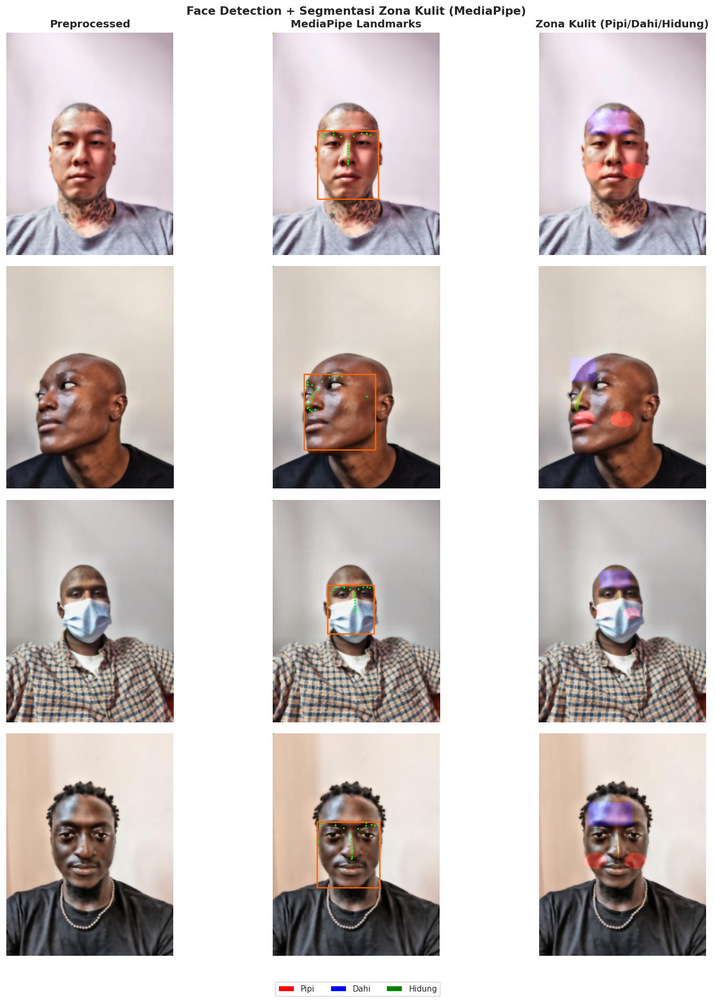

In [ ]:
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch

N_VIS  = 4
df_vis = df_sample.sample(min(N_VIS, len(df_sample)), random_state=42)
fig, axes = plt.subplots(N_VIS, 3, figsize=(14, N_VIS*4))

for ri, (_, row) in enumerate(df_vis.iterrows()):
    img = load_image(get_image_path(row))
    if img is None:
        for c in range(3): axes[ri][c].axis('off')
        continue
    img_pre = preprocess_image(img)
    lms, face_rect = detect_landmarks_dlib(img_pre)

    axes[ri][0].imshow(img_pre)
    if ri == 0: axes[ri][0].set_title('Preprocessed', fontweight='bold')
    axes[ri][0].set_ylabel(f'MST {row[MST_COL]}', fontsize=9)
    axes[ri][0].axis('off')

    overlay = img_pre.copy()
    if lms:
        for (x, y) in lms:
            cv2.circle(overlay, (x, y), 2, (0, 255, 0), -1)
        l, t, r, b = face_rect.left, face_rect.top, face_rect.right, face_rect.bottom
        cv2.rectangle(overlay, (l, t), (r, b), (255, 100, 0), 2)
    axes[ri][1].imshow(overlay)
    if ri == 0: axes[ri][1].set_title('MediaPipe Landmarks', fontweight='bold')
    axes[ri][1].axis('off')

    zone_viz = img_pre.copy().astype(np.float32)
    if lms:
        for mask, color in [
            (make_cheek_ellipse_mask(img_pre.shape, lms),             [80, 0, 0]),
            (make_forehead_mask(img_pre.shape, lms),                  [0, 0, 80]),
            (make_zone_mask(img_pre.shape, lms, list(range(27,36))), [0, 80, 0]),
        ]:
            zone_viz[mask] = np.clip(zone_viz[mask] + np.array(color), 0, 255)
    axes[ri][2].imshow(zone_viz.astype(np.uint8))
    if ri == 0: axes[ri][2].set_title('Zona Kulit (Pipi/Dahi/Hidung)', fontweight='bold')
    axes[ri][2].axis('off')

legend_el = [Patch(facecolor='red', label='Pipi'),
             Patch(facecolor='blue', label='Dahi'),
             Patch(facecolor='green', label='Hidung')]
fig.legend(handles=legend_el, loc='lower center', ncol=3, fontsize=9)
plt.suptitle('Face Detection + Segmentasi Zona Kulit (MediaPipe)', fontsize=13, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 1])
plt.savefig('/content/face_detection_zones.png', bbox_inches='tight')
plt.show()

In [ ]:
# Jalankan ini SEBELUM cell ekstraksi fitur
import os
FEAT_CSV = '/content/drive/MyDrive/Capstone/cielab_features.csv'
if os.path.exists(FEAT_CSV):
    os.remove(FEAT_CSV)
    print('Cache dihapus — akan re-ekstraksi dengan filter_skin_pixels baru')

In [ ]:
# Ekstraksi Fitur CIELAB
if os.path.exists(FEAT_CSV):
    df_feat = pd.read_csv(FEAT_CSV)
    print(f'✅ Fitur di-load dari cache: {df_feat.shape}')
else:
    print('🔄 Ekstraksi fitur CIELAB dari semua gambar well-lit...')
    records, failed = [], 0
    for idx, (_, row) in enumerate(df_welllit.iterrows()):
        if idx % 100 == 0: print(f'  [{idx}/{len(df_welllit)}]...')
        img = load_image(get_image_path(row))
        if img is None: failed += 1; continue
        img_pre = preprocess_image(img)
        lms, _  = detect_landmarks_dlib(img_pre)
        if lms is None: failed += 1; continue
        feats = get_all_skin_features(img_pre, lms)
        if feats is None: failed += 1; continue
        feats.update({
            'MST'     : row[MST_COL],
            'subject' : row[SUBJECT_COL],
            'image_id': row[IMAGE_COL],
            'lighting': row.get(LIGHTING_COL, ''),
        })
        records.append(feats)
    df_feat = pd.DataFrame(records)
    df_feat.to_csv(FEAT_CSV, index=False)
    print(f'\n✅ Selesai: {len(df_feat)} berhasil, {failed} gagal')
    print(f'   Disimpan ke {FEAT_CSV}')

print(f'Shape fitur: {df_feat.shape}')
df_feat.head(3)

🔄 Ekstraksi fitur CIELAB dari semua gambar well-lit...
  [0/893]...
  [100/893]...
  [200/893]...
  [300/893]...
  [400/893]...
  [500/893]...
  [600/893]...
  [700/893]...
  [800/893]...

✅ Selesai: 822 berhasil, 71 gagal
   Disimpan ke /content/drive/MyDrive/Capstone/cielab_features.csv
Shape fitur: (822, 33)


,cheek_L_mean,cheek_L_std,cheek_a_mean,cheek_a_std,cheek_b_mean,cheek_b_std,cheek_ITA,forehead_L_mean,forehead_L_std,forehead_a_mean,...,global_a_mean,global_a_std,global_b_mean,global_b_std,global_ITA,total_pixels,MST,subject,image_id,lighting
0,41.126722,10.267020,15.995490,3.355864,14.519010,2.071702,-31.431144,59.524113,9.351858,12.570827,...,13.845351,3.762832,13.165924,2.080939,13.208642,6091,1,subject_18,PXL_20220922_183620053.PORTRAIT.jpg,well_lit
1,43.961745,8.786646,16.312903,3.450850,15.842940,2.308270,-20.863457,50.099977,11.035106,14.943815,...,15.483060,3.013265,15.056449,1.787017,-7.838815,6241,1,subject_18,PXL_20220922_183617300.PORTRAIT.jpg,well_lit
2,56.255699,12.326066,14.825241,6.455248,13.854392,3.563849,24.300690,56.309479,13.241842,12.612853,...,13.565431,4.895367,14.646188,4.347635,23.627551,5628,1,subject_18,PXL_20220922_183616200.PORTRAIT.jpg,well_lit


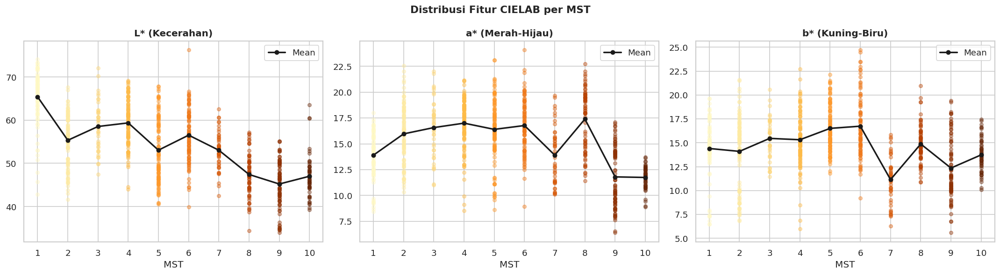

In [ ]:
# Visualisasi L*, a*, b* per MST
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
feat_cols   = ['global_L_mean', 'global_a_mean', 'global_b_mean']
feat_labels = ['L* (Kecerahan)', 'a* (Merah-Hijau)', 'b* (Kuning-Biru)']

for ax, col, label in zip(axes, feat_cols, feat_labels):
    for mst in sorted(df_feat['MST'].unique()):
        vals = df_feat[df_feat['MST'] == mst][col]
        ax.scatter([mst]*len(vals), vals, alpha=0.4, s=20,
                   color=plt.cm.YlOrBr(mst/10))
    means = df_feat.groupby('MST')[col].mean()
    ax.plot(means.index, means.values, 'ko-', lw=2, ms=5, label='Mean')
    ax.set_title(label, fontweight='bold'); ax.set_xlabel('MST'); ax.legend()
    ax.set_xticks(range(1, 11))

plt.suptitle('Distribusi Fitur CIELAB per MST', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/cielab_per_mst.png', bbox_inches='tight')
plt.show()

# Training Model

In [ ]:
# Pilih fitur
FEATURE_COLS = [c for c in df_feat.columns
                if any(c.startswith(p) for p in ['global_', 'cheek_', 'forehead_', 'nose_'])
                and ('mean' in c or 'std' in c or 'ITA' in c)]
print(f'Fitur ({len(FEATURE_COLS)}): {FEATURE_COLS}')

df_clean = df_feat[FEATURE_COLS + ['MST']].dropna()
X_raw    = df_clean[FEATURE_COLS].values
y_true   = df_clean['MST'].values.astype(int)

scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)
print(f'Data training: {X_scaled.shape}')

Fitur (28): ['cheek_L_mean', 'cheek_L_std', 'cheek_a_mean', 'cheek_a_std', 'cheek_b_mean', 'cheek_b_std', 'cheek_ITA', 'forehead_L_mean', 'forehead_L_std', 'forehead_a_mean', 'forehead_a_std', 'forehead_b_mean', 'forehead_b_std', 'forehead_ITA', 'nose_L_mean', 'nose_L_std', 'nose_a_mean', 'nose_a_std', 'nose_b_mean', 'nose_b_std', 'nose_ITA', 'global_L_mean', 'global_L_std', 'global_a_mean', 'global_a_std', 'global_b_mean', 'global_b_std', 'global_ITA']
Data training: (789, 28)


🔄 Hitung Elbow...
  k= 2 | sil=0.152 | DB=2.136
  k= 3 | sil=0.144 | DB=2.033
  k= 4 | sil=0.129 | DB=2.111
  k= 5 | sil=0.140 | DB=1.910
  k= 6 | sil=0.141 | DB=1.909
  k= 7 | sil=0.132 | DB=1.903
  k= 8 | sil=0.124 | DB=1.904
  k= 9 | sil=0.127 | DB=1.835
  k=10 | sil=0.124 | DB=1.962
  k=11 | sil=0.136 | DB=1.806
  k=12 | sil=0.136 | DB=1.826
  k=13 | sil=0.139 | DB=1.803
  k=14 | sil=0.133 | DB=1.856
  k=15 | sil=0.136 | DB=1.855


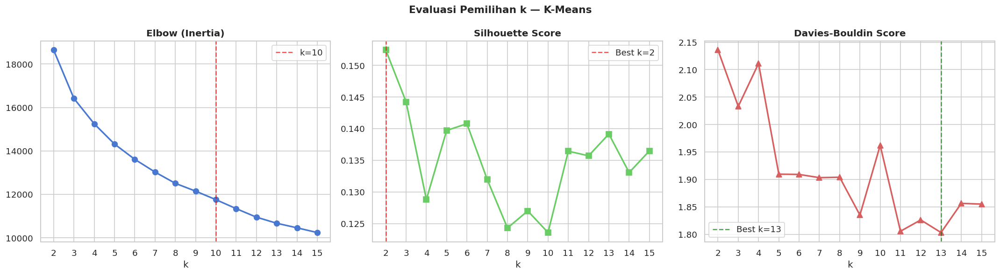


Best k (Silhouette): 2 | Best k (DB): 13


In [ ]:
# Elbow + Silhouette + Davies-Bouldin
K_range = range(2, 16)
inertias, sil_scores, db_scores = [], [], []

print('🔄 Hitung Elbow...')
for k in K_range:
    km  = KMeans(n_clusters=k, n_init=10, random_state=42)
    lbl = km.fit_predict(X_scaled)
    inertias.append(km.inertia_)
    sil_scores.append(silhouette_score(X_scaled, lbl))
    db_scores.append(davies_bouldin_score(X_scaled, lbl))
    print(f'  k={k:2d} | sil={sil_scores[-1]:.3f} | DB={db_scores[-1]:.3f}')

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
k_list = list(K_range)

axes[0].plot(k_list, inertias, 'bo-', lw=2, ms=7)
axes[0].axvline(10, color='red', ls='--', label='k=10', alpha=0.7)
axes[0].set_title('Elbow (Inertia)', fontweight='bold'); axes[0].legend()

best_sil = k_list[np.argmax(sil_scores)]
axes[1].plot(k_list, sil_scores, 'gs-', lw=2, ms=7)
axes[1].axvline(best_sil, color='red', ls='--', label=f'Best k={best_sil}', alpha=0.7)
axes[1].set_title('Silhouette Score', fontweight='bold'); axes[1].legend()

best_db = k_list[np.argmin(db_scores)]
axes[2].plot(k_list, db_scores, 'r^-', lw=2, ms=7)
axes[2].axvline(best_db, color='green', ls='--', label=f'Best k={best_db}', alpha=0.7)
axes[2].set_title('Davies-Bouldin Score', fontweight='bold'); axes[2].legend()

for ax in axes:
    ax.set_xlabel('k'); ax.set_xticks(k_list)

plt.suptitle('Evaluasi Pemilihan k — K-Means', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/elbow_plot.png', bbox_inches='tight')
plt.show()
print(f'\nBest k (Silhouette): {best_sil} | Best k (DB): {best_db}')

✅ K-Means k=10
   Silhouette : 0.1308
   DB Score   : 1.8458
   Inertia    : 11668.42


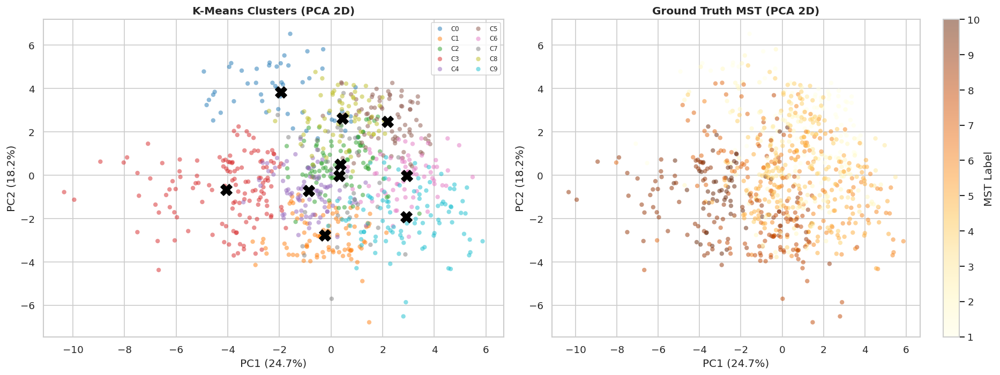

✅ Model disimpan ke /content/drive/MyDrive/Capstone/models


In [ ]:
# Training K-Means final (k=10, sesuai MST 1-10)
K_FINAL  = 10
kmeans   = KMeans(n_clusters=K_FINAL, n_init=20, random_state=42, max_iter=500)
clusters = kmeans.fit_predict(X_scaled)

sil_final = silhouette_score(X_scaled, clusters)
db_final  = davies_bouldin_score(X_scaled, clusters)
print(f'✅ K-Means k={K_FINAL}')
print(f'   Silhouette : {sil_final:.4f}')
print(f'   DB Score   : {db_final:.4f}')
print(f'   Inertia    : {kmeans.inertia_:.2f}')

# PCA visualisasi
pca   = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
cmap10 = plt.cm.get_cmap('tab10', K_FINAL)

for cid in range(K_FINAL):
    m = clusters == cid
    axes[0].scatter(X_pca[m,0], X_pca[m,1], c=[cmap10(cid)],
                    label=f'C{cid}', alpha=0.5, s=25, edgecolors='none')
ctr = pca.transform(kmeans.cluster_centers_)
axes[0].scatter(ctr[:,0], ctr[:,1], c='black', s=160, marker='X', zorder=5)
axes[0].set_title('K-Means Clusters (PCA 2D)', fontweight='bold')
axes[0].legend(fontsize=7, ncol=2)

sc = axes[1].scatter(X_pca[:,0], X_pca[:,1], c=y_true,
                      cmap='YlOrBr', alpha=0.5, s=25, edgecolors='none')
plt.colorbar(sc, ax=axes[1], label='MST Label')
axes[1].set_title('Ground Truth MST (PCA 2D)', fontweight='bold')

for ax in axes:
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')

plt.tight_layout()
plt.savefig('/content/kmeans_pca.png', bbox_inches='tight')
plt.show()

# Simpan model
joblib.dump(kmeans, f'{MODEL_DIR}/kmeans_k{K_FINAL}.pkl')
joblib.dump(scaler, f'{MODEL_DIR}/scaler.pkl')
joblib.dump(pca,    f'{MODEL_DIR}/pca.pkl')
print(f'✅ Model disimpan ke {MODEL_DIR}')

# BACKEND

In [ ]:
# Load Foundation Database

df_foundation = pd.read_csv(FOUNDATION_CSV)

print(df_foundation[['Brand','Product','Shade','Undertone',
                      'lab_L','lab_a','lab_b','mst_id','mst_label','mst_hex']].head())
print(f'\nTotal produk : {len(df_foundation)}')
print(f'Brand        : {df_foundation["Brand"].unique().tolist()}')
print(f'MST coverage : {sorted(df_foundation["mst_id"].unique())}')

    Brand                             Product                   Shade  \
0  Wardah  Lightening Liquid Foundation 25 Ml   01 Neutral Fair (12N)   
1  Wardah  Lightening Liquid Foundation 25 Ml  02 Neutral Beige (32N)   
2  Wardah  Lightening Liquid Foundation 25 Ml     03 Warm Beige (32W)   
3  Wardah  Lightening Liquid Foundation 25 Ml        04 Caramel (53W)   
4  Wardah  Lightening Liquid Foundation 25 Ml     05 Warm Ivory (23W)   

  Undertone      lab_L      lab_a      lab_b  mst_id   mst_label  mst_hex  
0   Neutral  82.522500   8.418279  16.478633       1   Porcelain  #f6ede4  
1   Neutral  79.767570   6.910563  22.664579       5      Medium  #d7bd96  
2      Warm  73.197114  11.314618  28.051460       5      Medium  #d7bd96  
3      Warm  70.591584  21.042820  34.464405       6  Medium Tan  #a07850  
4      Warm  77.636980  12.962413  26.780174       5      Medium  #d7bd96  

Total produk : 202
Brand        : ['Wardah', 'Luxcrime', 'Omg', 'Mop', 'Jacquelle', 'Dazzle Me', 'Make O

In [ ]:
def build_robust_centroids(df_foundation):
    """Gunakan median bukan mean — robust terhadap outlier di MST 1-3."""
    return (
        df_foundation
        .groupby('mst_id')[['lab_L', 'lab_a', 'lab_b']]
        .median()
        .rename(columns={'lab_L': 'L_ref', 'lab_a': 'a_ref', 'lab_b': 'b_ref'})
        .reset_index()
    )

In [ ]:
# Hitung centroid L*a*b* per mst_id dari data produk nyata
foundation_centroids = build_robust_centroids(df_foundation)
print(foundation_centroids.round(2))

   mst_id  L_ref  a_ref  b_ref
0       1  86.90   9.04  17.09
1       2  84.11   7.58  11.95
2       3  82.44   9.12  20.45
3       4  77.93  15.68  24.74
4       5  75.67  13.70  27.09
5       6  60.70  21.20  34.66
6       7  39.38  21.52  29.02
7       8  24.20  17.70  22.43
8       9  21.72   7.18   7.03
9      10   7.53  13.28   3.96


In [ ]:
# Fungsi Rekomendasi Foundation

def recommend_foundation(mst_pred, L_inp, a_inp, b_inp, df_foundation, top_n=5):
    """
    - Filter produk berdasarkan mst_id yang diprediksi DULU (±1 MST tolerance)
    - Baru sort berdasarkan Delta E dalam kelompok itu
    - Fallback ke global Delta E kalau produk di MST tersebut < top_n
    """
    df = df_foundation.copy()
    df['delta_e'] = np.sqrt(
        (df['lab_L'] - L_inp)**2 +
        (df['lab_a'] - a_inp)**2 +
        (df['lab_b'] - b_inp)**2
    )

    # Prioritas: produk dari MST prediksi ± 1
    mst_range   = [mst_pred - 1, mst_pred, mst_pred + 1]
    df_primary  = df[df['mst_id'].isin(mst_range)].sort_values('delta_e')
    df_fallback = df[~df['mst_id'].isin(mst_range)].sort_values('delta_e')
    df_merged   = pd.concat([df_primary, df_fallback]).head(top_n)

    return (
        df_merged[['Brand', 'Product', 'Shade', 'Undertone',
                   'lab_L', 'lab_a', 'lab_b', 'mst_id', 'mst_label', 'mst_hex', 'delta_e']]
        .reset_index(drop=True)
    )

In [ ]:
# Fungsi Hybrid Prediction

def predict_with_cielab_fallback(feats, model, scaler, kmeans,
                                  foundation_centroids, feat_cols,
                                  alpha=0.40,
                                  temperature=0.60,
                                  sigma_eucl=2.0,
                                  sigma_ita=4.0):
    X  = np.array([[feats.get(c, 0) for c in feat_cols]])
    Xs = scaler.transform(X)
    Xd = np.hstack([Xs, kmeans.transform(Xs)])

    model_proba   = model.predict_proba(Xd)[0]
    model_classes = model.classes_

    # Temperature scaling
    log_p = np.log(model_proba + 1e-10) / temperature
    model_proba = np.exp(log_p - log_p.max())
    model_proba = model_proba / model_proba.sum()

    L_inp   = feats.get('global_L_mean', 50)
    a_inp   = feats.get('global_a_mean', 8)
    b_inp   = feats.get('global_b_mean', 12)
    ita_inp = math.degrees(math.atan2(L_inp - 50, b_inp))

    mst_keys = foundation_centroids['mst_id'].values

    # CIELAB Euclidean — pakai fixed sigma, bukan dist.std()
    dist_arr = np.sqrt(
        (foundation_centroids['L_ref'].values - L_inp)**2 +
        (foundation_centroids['a_ref'].values - a_inp)**2 +
        (foundation_centroids['b_ref'].values - b_inp)**2
    )
    inv_dist     = np.exp(-dist_arr / sigma_eucl)       # ← fix: sigma_eucl bukan std
    db_proba_lab = inv_dist / inv_dist.sum()

    # ITA — pakai fixed sigma
    ita_centroids = np.degrees(
        np.arctan2(
            foundation_centroids['L_ref'].values - 50,
            foundation_centroids['b_ref'].values
        )
    )
    ita_dist     = np.abs(ita_centroids - ita_inp)
    inv_ita      = np.exp(-ita_dist / sigma_ita)        # ← fix: sigma_ita bukan std
    db_proba_ita = inv_ita / inv_ita.sum()

    # Gabung: 60% Euclidean + 40% ITA
    db_proba = 0.60 * db_proba_lab + 0.40 * db_proba_ita

    combined = {}
    for i, mst in enumerate(mst_keys):
        idx     = np.where(model_classes == mst)[0]
        model_p = float(model_proba[idx[0]]) if len(idx) > 0 else 0.0
        db_p    = float(db_proba[i])
        combined[mst] = (1 - alpha) * model_p + alpha * db_p

    best_mst = max(combined, key=combined.get)
    total    = sum(combined.values())

    top3_candidates = sorted(combined.items(), key=lambda x: -x[1])
    top3_filtered   = [item for item in top3_candidates
                       if abs(item[0] - best_mst) <= 2][:3]
    if len(top3_filtered) < 3:
        remaining        = [item for item in top3_candidates if item not in top3_filtered]
        remaining_sorted = sorted(remaining, key=lambda x: abs(x[0] - best_mst))
        top3_filtered   += remaining_sorted[:3 - len(top3_filtered)]

    return (
        int(best_mst),
        combined[best_mst] / total * 100,
        [{'mst': int(m), 'conf': round(p / total * 100, 1)} for m, p in top3_filtered]
    )

# Evaluasi Performa

Pemetaan Cluster → MST:
  Cluster 0 → MST 2
  Cluster 1 → MST 8
  Cluster 2 → MST 4
  Cluster 3 → MST 9
  Cluster 4 → MST 5
  Cluster 5 → MST 1
  Cluster 6 → MST 3
  Cluster 7 → MST 10
  Cluster 8 → MST 7
  Cluster 9 → MST 6


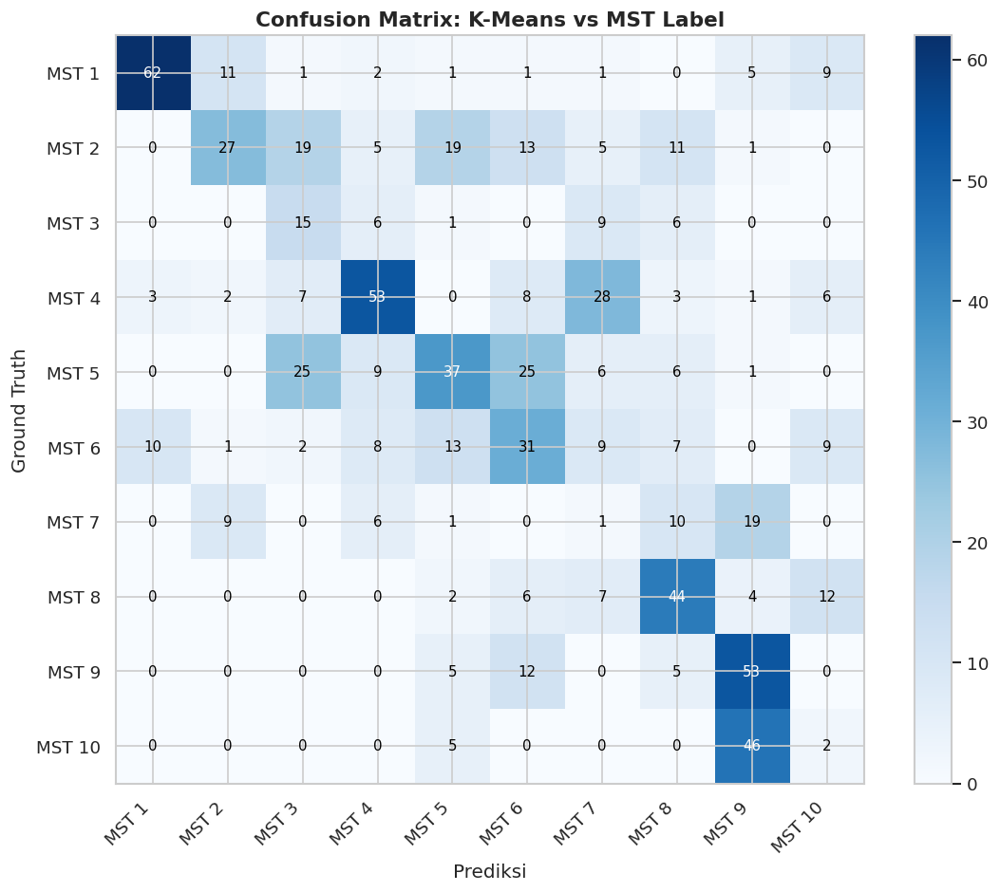


📋 Classification Report:
              precision  recall  f1-score  support
MST 1             0.827   0.667     0.738   93.000
MST 2             0.540   0.270     0.360  100.000
MST 3             0.217   0.405     0.283   37.000
MST 4             0.596   0.477     0.530  111.000
MST 5             0.440   0.339     0.383  109.000
MST 6             0.323   0.344     0.333   90.000
MST 7             0.015   0.022     0.018   46.000
MST 8             0.478   0.587     0.527   75.000
MST 9             0.408   0.707     0.517   75.000
MST 10            0.053   0.038     0.044   53.000
accuracy          0.412   0.412     0.412    0.412
macro avg         0.390   0.386     0.373  789.000
weighted avg      0.446   0.412     0.415  789.000


In [ ]:
# Evaluasi K-Means (Hungarian Mapping + Confusion Matrix)

def map_clusters(cluster_labels, true_labels, n_clusters):
    mst_vals = sorted(np.unique(true_labels))
    cost = np.zeros((n_clusters, len(mst_vals)))
    for c in range(n_clusters):
        for j, m in enumerate(mst_vals):
            cost[c, j] = -np.sum(true_labels[cluster_labels == c] == m)
    ri, ci  = linear_sum_assignment(cost)
    mapping = {r: mst_vals[c] for r, c in zip(ri, ci)}
    return np.array([mapping[c] for c in cluster_labels]), mapping

y_pred_mapped, c2mst = map_clusters(clusters, y_true, K_FINAL)
print('Pemetaan Cluster → MST:')
for c, m in sorted(c2mst.items()):
    print(f'  Cluster {c} → MST {m}')

mst_labels = sorted(np.unique(y_true))
cm = confusion_matrix(y_true, y_pred_mapped, labels=mst_labels)

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(cm, cmap='Blues')
plt.colorbar(im, ax=ax)
ax.set_xticks(range(len(mst_labels))); ax.set_yticks(range(len(mst_labels)))
ax.set_xticklabels([f'MST {m}' for m in mst_labels], rotation=45, ha='right')
ax.set_yticklabels([f'MST {m}' for m in mst_labels])
ax.set_xlabel('Prediksi'); ax.set_ylabel('Ground Truth')
ax.set_title('Confusion Matrix: K-Means vs MST Label', fontweight='bold', fontsize=13)
for i in range(len(mst_labels)):
    for j in range(len(mst_labels)):
        v = cm[i, j]
        ax.text(j, i, str(v), ha='center', va='center', fontsize=9,
                color='white' if v > cm.max()*0.5 else 'black')
plt.tight_layout()
plt.savefig('/content/confusion_matrix.png', bbox_inches='tight')
plt.show()

report   = classification_report(
    y_true, y_pred_mapped, labels=mst_labels,
    target_names=[f'MST {m}' for m in mst_labels], output_dict=True
)
df_report = pd.DataFrame(report).T
print('\n📋 Classification Report:')
print(df_report.round(3).to_string())
df_report.to_csv('/content/drive/MyDrive/CAPSTONE/classification_report.csv')

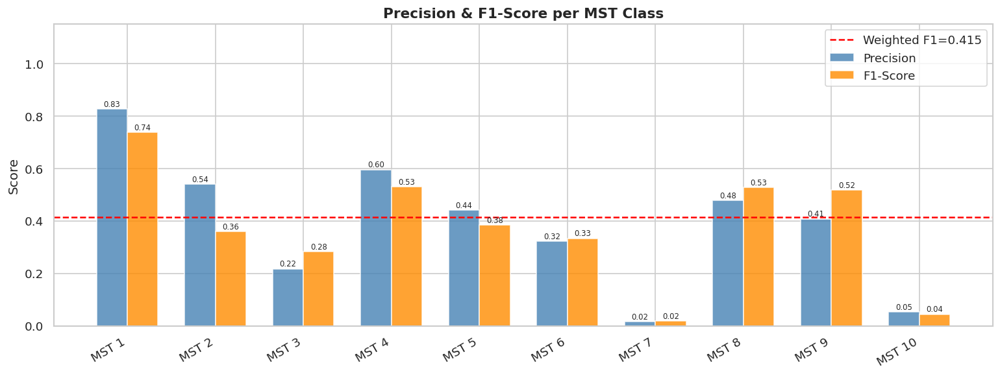

In [ ]:
# Plot F1 per MST
f1s   = {k: v['f1-score']  for k, v in report.items() if k.startswith('MST')}
precs = {k: v['precision'] for k, v in report.items() if k.startswith('MST')}
x = np.arange(len(f1s)); w = 0.35

fig, ax = plt.subplots(figsize=(13, 5))
b1 = ax.bar(x-w/2, list(precs.values()), w, label='Precision', color='steelblue', alpha=0.8)
b2 = ax.bar(x+w/2, list(f1s.values()),   w, label='F1-Score',  color='darkorange', alpha=0.8)
ax.set_xticks(x); ax.set_xticklabels(list(f1s.keys()), rotation=30, ha='right')
ax.set_ylim(0, 1.15); ax.set_ylabel('Score')
ax.set_title('Precision & F1-Score per MST Class', fontweight='bold', fontsize=13)
ax.axhline(report['weighted avg']['f1-score'], color='red', ls='--',
           label=f'Weighted F1={report["weighted avg"]["f1-score"]:.3f}')
ax.legend()
for b in [*b1, *b2]:
    ax.text(b.get_x()+b.get_width()/2, b.get_height()+0.01,
            f'{b.get_height():.2f}', ha='center', fontsize=7)
plt.tight_layout()
plt.savefig('/content/f1_per_mst.png', bbox_inches='tight')
plt.show()

🔬 K-Means + Random Forest (Hybrid)
   CV F1 weighted (5-fold): 0.7830 ± 0.0368


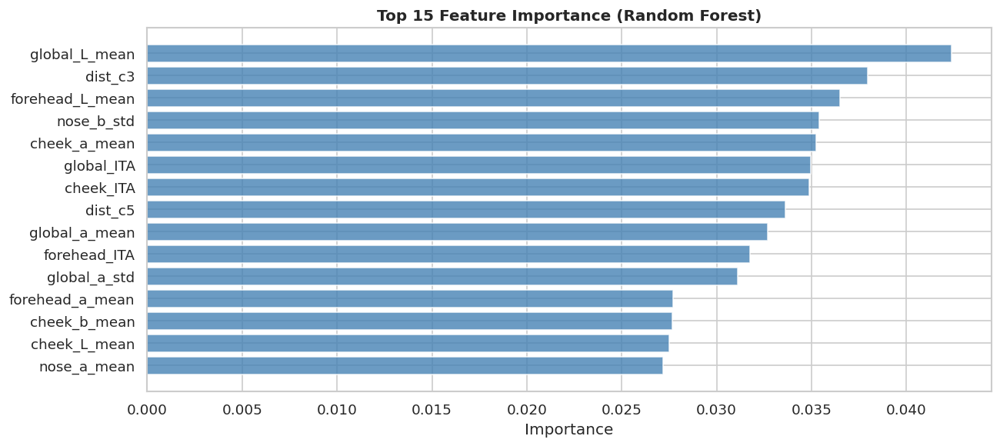

In [ ]:
# Training Random Forest Baseline

dist_to_centers = kmeans.transform(X_scaled)
X_aug = np.hstack([X_scaled, dist_to_centers])

rf  = RandomForestClassifier(n_estimators=200, max_depth=12, random_state=42, n_jobs=-1)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(rf, X_aug, y_true, cv=skf, scoring='f1_weighted', n_jobs=-1)

print('🔬 K-Means + Random Forest (Hybrid)')
print(f'   CV F1 weighted (5-fold): {cv_scores.mean():.4f} ± {cv_scores.std():.4f}')

rf.fit(X_aug, y_true)
joblib.dump(rf, f'{MODEL_DIR}/rf_classifier.pkl')

feat_names = FEATURE_COLS + [f'dist_c{i}' for i in range(K_FINAL)]
top15 = np.argsort(rf.feature_importances_)[-15:][::-1]

fig, ax = plt.subplots(figsize=(11, 5))
ax.barh([feat_names[i] for i in top15[::-1]],
        rf.feature_importances_[top15[::-1]], color='steelblue', alpha=0.8)
ax.set_title('Top 15 Feature Importance (Random Forest)', fontweight='bold', fontsize=12)
ax.set_xlabel('Importance')
plt.tight_layout()
plt.savefig('/content/feature_importance.png', bbox_inches='tight')
plt.show()

# Deployment

In [ ]:
# Hyperparameter Tuning (RF + GB + SVM)

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier, VotingClassifier
from sklearn.svm import SVC

print('🔄 Hyperparameter tuning dimulai... (~5-10 menit)\n')

# RF
rf_search = RandomizedSearchCV(
    RandomForestClassifier(random_state=42, n_jobs=-1),
    {'n_estimators': [200,300,500], 'max_depth': [10,15,20,None],
     'min_samples_split': [2,5,10], 'min_samples_leaf': [1,2,4],
     'max_features': ['sqrt','log2',0.5], 'class_weight': ['balanced',None]},
    n_iter=30, cv=skf, scoring='f1_weighted', random_state=42, n_jobs=-1, verbose=1
)
rf_search.fit(X_aug, y_true)
print(f'\n✅ RF Terbaik : {rf_search.best_score_:.4f} | {rf_search.best_params_}')

# GB
gb_search = RandomizedSearchCV(
    GradientBoostingClassifier(random_state=42),
    {'n_estimators': [100,200,300], 'learning_rate': [0.05,0.1,0.2],
     'max_depth': [3,5,7], 'subsample': [0.7,0.85,1.0], 'max_features': ['sqrt','log2']},
    n_iter=20, cv=skf, scoring='f1_weighted', random_state=42, n_jobs=-1, verbose=1
)
gb_search.fit(X_aug, y_true)
print(f'\n✅ GB Terbaik : {gb_search.best_score_:.4f} | {gb_search.best_params_}')

# SVM
svm_search = RandomizedSearchCV(
    SVC(probability=True, random_state=42),
    {'C': [0.1,1,10,100], 'gamma': ['scale','auto',0.001,0.01],
     'kernel': ['rbf','poly'], 'class_weight': ['balanced',None]},
    n_iter=20, cv=skf, scoring='f1_weighted', random_state=42, n_jobs=-1, verbose=1
)
svm_search.fit(X_aug, y_true)
print(f'\n✅ SVM Terbaik: {svm_search.best_score_:.4f} | {svm_search.best_params_}')

🔄 Hyperparameter tuning dimulai... (~5-10 menit)

Fitting 5 folds for each of 30 candidates, totalling 150 fits

✅ RF Terbaik : 0.7921 | {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 15, 'class_weight': 'balanced'}
Fitting 5 folds for each of 20 candidates, totalling 100 fits

✅ GB Terbaik : 0.8077 | {'subsample': 1.0, 'n_estimators': 200, 'max_features': 'log2', 'max_depth': 7, 'learning_rate': 0.1}
Fitting 5 folds for each of 20 candidates, totalling 100 fits

✅ SVM Terbaik: 0.8495 | {'kernel': 'rbf', 'gamma': 'auto', 'class_weight': None, 'C': 100}


In [ ]:
# Ensemble v1 (tanpa class weighting)

ensemble = VotingClassifier(
    estimators=[('rf', rf_search.best_estimator_),
                ('gb', gb_search.best_estimator_),
                ('svm', svm_search.best_estimator_)],
    voting='soft', weights=[2, 1, 1], n_jobs=-1
)
cv_ensemble = cross_val_score(ensemble, X_aug, y_true,
                               cv=skf, scoring='f1_weighted', n_jobs=-1)
print(f'✅ Ensemble v1 CV F1: {cv_ensemble.mean():.4f} ± {cv_ensemble.std():.4f}')

ensemble.fit(X_aug, y_true)
joblib.dump(ensemble,                    f'{MODEL_DIR}/ensemble_tuned.pkl')
joblib.dump(rf_search.best_estimator_,  f'{MODEL_DIR}/rf_tuned.pkl')
joblib.dump(gb_search.best_estimator_,  f'{MODEL_DIR}/gb_tuned.pkl')
joblib.dump(svm_search.best_estimator_, f'{MODEL_DIR}/svm_tuned.pkl')
print(f'✅ Model disimpan ke {MODEL_DIR}')

✅ Ensemble v1 CV F1: 0.8352 ± 0.0331
✅ Model disimpan ke /content/drive/MyDrive/Capstone/models


In [ ]:
# Class Weighting (boost MST 7-10)

from sklearn.utils.class_weight import compute_sample_weight

sample_weights          = compute_sample_weight('balanced', y_true)
dark_mask               = np.isin(y_true, [7, 8, 9, 10])
sample_weights[dark_mask] *= 2.0
sample_weights          /= sample_weights.mean()

print(f'  Avg weight MST 1-3  : {sample_weights[np.isin(y_true,[1,2,3])].mean():.3f}')
print(f'  Avg weight MST 4-6  : {sample_weights[np.isin(y_true,[4,5,6])].mean():.3f}')
print(f'  Avg weight MST 7-10 : {sample_weights[dark_mask].mean():.3f}')

  Avg weight MST 1-3  : 0.735
  Avg weight MST 4-6  : 0.545
  Avg weight MST 7-10 : 1.811


In [ ]:
from sklearn.base import clone

rf_balanced = RandomForestClassifier(
    **{**rf_search.best_params_, 'class_weight': 'balanced'},
    random_state=42, n_jobs=-1)
rf_balanced.fit(X_aug, y_true, sample_weight=sample_weights)

gb_balanced = GradientBoostingClassifier(**gb_search.best_params_, random_state=42)
gb_balanced.fit(X_aug, y_true, sample_weight=sample_weights)

svm_balanced = SVC(
    probability=True, class_weight='balanced',
    C=svm_search.best_params_.get('C', 10),
    gamma=svm_search.best_params_.get('gamma', 'scale'),
    kernel=svm_search.best_params_.get('kernel', 'rbf'),
    random_state=42)
svm_balanced.fit(X_aug, y_true, sample_weight=sample_weights)

ensemble_v2 = VotingClassifier(
    estimators=[('rf', rf_balanced), ('gb', gb_balanced), ('svm', svm_balanced)],
    voting='soft', weights=[2, 1.5, 1], n_jobs=-1
)

# Ini memastikan tiap fold benar-benar dilatih dari awal
cv_v2_scores = []
for train_idx, val_idx in skf.split(X_aug, y_true):
    X_tr, X_val = X_aug[train_idx], X_aug[val_idx]
    y_tr, y_val = y_true[train_idx], y_true[val_idx]
    sw_tr       = sample_weights[train_idx]

    fold_model = VotingClassifier(
        estimators=[
            ('rf',  clone(rf_balanced)),
            ('gb',  clone(gb_balanced)),
            ('svm', clone(svm_balanced)),
        ],
        voting='soft', weights=[2, 1.5, 1], n_jobs=-1
    )
    # Fit tiap estimator dengan sample_weight secara manual
    fold_model.fit(X_tr, y_tr)   # VotingClassifier tidak support sample_weight langsung
    y_hat = fold_model.predict(X_val)
    cv_v2_scores.append(f1_score(y_val, y_hat, average='weighted'))

cv_v2_mean = np.mean(cv_v2_scores)
cv_v2_std  = np.std(cv_v2_scores)
print(f'✅ Ensemble v2 CV F1 (proper): {cv_v2_mean:.4f} ± {cv_v2_std:.4f}')

# Fit final pakai semua data
ensemble_v2.fit(X_aug, y_true)
joblib.dump(ensemble_v2, f'{MODEL_DIR}/ensemble_v2_balanced.pkl')
print(f'✅ Model disimpan')

# Untuk konsistensi dengan cell perbandingan nanti
cv_v2 = type('obj', (object,), {'mean': lambda self: cv_v2_mean,
                                  'std': lambda self: cv_v2_std})()

✅ Ensemble v2 CV F1 (proper): 0.8226 ± 0.0416
✅ Model disimpan


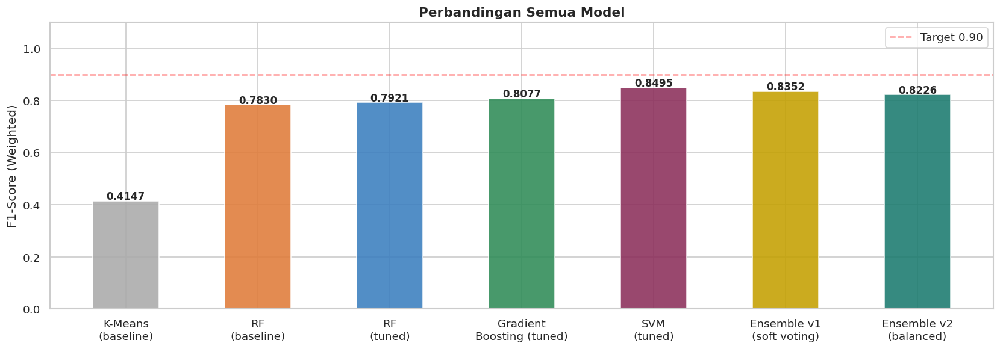


🏆 Model terbaik: SVM (tuned) → F1 = 0.8495


In [ ]:
# Perbandingan Semua Model

results = {
    'K-Means\n(baseline)'        : f1_score(y_true, y_pred_mapped, average='weighted'),
    'RF\n(baseline)'             : cv_scores.mean(),
    'RF\n(tuned)'                : rf_search.best_score_,
    'Gradient\nBoosting (tuned)' : gb_search.best_score_,
    'SVM\n(tuned)'               : svm_search.best_score_,
    'Ensemble v1\n(soft voting)' : cv_ensemble.mean(),
    'Ensemble v2\n(balanced)'    : cv_v2_mean,
}

fig, ax = plt.subplots(figsize=(14, 5))
colors = ['#aaaaaa','#E07B39','#3A7EBF','#2e8b57','#8b2e5a','#c4a000','#1a7a6e']
bars   = ax.bar(results.keys(), results.values(),
                color=colors, alpha=0.88, edgecolor='white', width=0.5)
for b, v in zip(bars, results.values()):
    ax.text(b.get_x()+b.get_width()/2, v+0.005,
            f'{v:.4f}', ha='center', fontsize=10, fontweight='bold')
ax.set_ylim(0, 1.1)
ax.set_ylabel('F1-Score (Weighted)', fontsize=12)
ax.set_title('Perbandingan Semua Model', fontsize=13, fontweight='bold')
ax.axhline(0.9, color='red', ls='--', alpha=0.4, label='Target 0.90')
ax.legend()
plt.tight_layout()
plt.savefig('/content/model_comparison_tuned.png', bbox_inches='tight')
plt.show()

best_name  = max(results, key=results.get)
best_score = results[best_name]
print(f'\n🏆 Model terbaik: {best_name.replace(chr(10)," ")} → F1 = {best_score:.4f}')

In [ ]:
# ── Simpan model terbaik ke file standar ──
MODEL_REGISTRY = {
    'K-Means\n(baseline)'        : None,  # tidak bisa dipakai langsung
    'RF\n(baseline)'             : f'{MODEL_DIR}/rf_classifier.pkl',
    'RF\n(tuned)'                : f'{MODEL_DIR}/rf_tuned.pkl',
    'Gradient\nBoosting (tuned)' : f'{MODEL_DIR}/gb_tuned.pkl',
    'SVM\n(tuned)'               : f'{MODEL_DIR}/svm_tuned.pkl',
    'Ensemble v1\n(soft voting)' : f'{MODEL_DIR}/ensemble_tuned.pkl',
    'Ensemble v2\n(balanced)'    : f'{MODEL_DIR}/ensemble_v2_balanced.pkl',
}

# Cari model terbaik yang bisa dimuat (bukan K-Means baseline)
best_loadable = max(
    {k: v for k, v in results.items() if MODEL_REGISTRY.get(k) is not None},
    key=results.get
)
BEST_MODEL_PATH = MODEL_REGISTRY[best_loadable]

# Salin ke nama standar supaya detector selalu load yang terbaik
import shutil
shutil.copy(BEST_MODEL_PATH, f'{MODEL_DIR}/best_model.pkl')

print(f'🏆 Model terbaik : {best_loadable.replace(chr(10), " ")}')
print(f'   F1 Score      : {results[best_loadable]:.4f}')
print(f'   Path asli     : {BEST_MODEL_PATH}')
print(f'   Disimpan ke   : {MODEL_DIR}/best_model.pkl')

🏆 Model terbaik : SVM (tuned)
   F1 Score      : 0.8495
   Path asli     : /content/drive/MyDrive/Capstone/models/svm_tuned.pkl
   Disimpan ke   : /content/drive/MyDrive/Capstone/models/best_model.pkl


In [ ]:
def detect_undertone(L, a, b):
    """
    Deteksi undertone langsung dari CIELAB kulit.

    Rumus berdasarkan standar kolorimetri kulit:
    - b* = kuning-biru: tinggi → warm, rendah → cool
    - a* = merah-hijau: tinggi → cool/pink, sedang → warm/neutral
    - Rasio a*/b* menentukan dominasi warna
    """
    ratio = a / (b + 1e-6)  # rasio merah vs kuning

    if b > 20 and ratio < 0.65:
        return 'Warm'       # kuning dominan
    elif b > 14 and ratio < 0.80:
        return 'Neutral-Warm'
    elif a > 14 and ratio > 0.85:
        return 'Cool'       # merah/pink dominan
    elif a > 12 and b > 16 and ratio >= 0.65 and ratio <= 0.85:
        return 'Neutral'
    elif b <= 14 and a <= 12:
        return 'Cool'       # sangat rendah kedua → cenderung cool/pink
    else:
        return 'Neutral'

In [ ]:
class FoundationDetectorV3:
    """
    v3.2.0 — Fix:
    - alpha & temperature tidak lagi hardcode (pakai nilai yang benar)
    - recommend_foundation sekarang filter by mst_pred dulu
    - top3 hex lookup dari centroids (bukan top5_recs yang terbatas)
    - Centroid pakai median (robust)
    """
    VERSION = '3.2.0'

    def __init__(self, model_dir, df_foundation, feature_cols):
        self.kmeans    = joblib.load(f'{model_dir}/kmeans_k{K_FINAL}.pkl')
        self.scaler    = joblib.load(f'{model_dir}/scaler.pkl')
        self.ensemble  = joblib.load(f'{model_dir}/best_model.pkl')
        self.df_found  = df_foundation
        self.centroids = build_robust_centroids(df_foundation)  # ← median, bukan mean
        self.feat_cols = feature_cols
        self.latencies = []

        # Buat lookup: mst_id → hex warna representatif
        self.mst_hex_lookup = (
            df_foundation.drop_duplicates('mst_id')
            .set_index('mst_id')['mst_hex']
            .to_dict()
        )

        print(f'✅ FoundationDetectorV3 v{self.VERSION} loaded')
        print(f'   Foundation DB : {len(df_foundation)} produk, {df_foundation["Brand"].nunique()} brand')
        print(f'   MST hex lookup: {self.mst_hex_lookup}')

    def predict(self, img_or_path):
        import time; t0 = time.time()
        img = load_image(img_or_path) if isinstance(img_or_path, str) else img_or_path
        if img is None:
            return {'status': 'error', 'message': 'Gambar tidak bisa dibaca'}

        img_pre = preprocess_image(img)
        lms, _  = detect_landmarks_dlib(img_pre)
        if lms is None:
            return {'status': 'error', 'message': 'Wajah tidak terdeteksi'}

        feats = get_all_skin_features(img_pre, lms)
        if feats is None:
            return {'status': 'error', 'message': 'Ekstraksi fitur gagal'}

        mst, conf, top3 = predict_with_cielab_fallback(
            feats, self.ensemble, self.scaler, self.kmeans,
            self.centroids, self.feat_cols,
            alpha=0.40,
            temperature=0.6,
            sigma_eucl=2.0,
            sigma_ita=4.0
        )

        recs    = recommend_foundation(
            mst,
            feats['global_L_mean'], feats['global_a_mean'], feats['global_b_mean'],
            self.df_found, top_n=5
        )
        top_rec = recs.iloc[0]

        top3_with_hex = []
        for t in top3:
            top3_with_hex.append({
                'mst' : t['mst'],
                'conf': t['conf'],
                'hex' : self.mst_hex_lookup.get(t['mst'], '#888888')  # ← langsung dari lookup
            })

        ms = round((time.time() - t0) * 1000, 1)
        self.latencies.append(ms)
        return {
            'status'      : 'success',
            'version'     : self.VERSION,
            'mst_pred'    : mst,
            'confidence'  : round(conf, 1),
            'shade_name'  : top_rec['Shade'],
            'brand'       : top_rec['Brand'],
            'product'     : top_rec['Product'],
            'hex_color'   : top_rec['mst_hex'],
            'undertone'   : detect_undertone(
                                feats['global_L_mean'],
                                feats['global_a_mean'],
                                feats['global_b_mean']),
            'delta_e'     : round(top_rec['delta_e'], 2),
            'top5_recs'   : recs.to_dict(orient='records'),
            'top3'        : top3_with_hex,  # ← sekarang ada field 'hex'
            'cielab'      : {'L': round(feats.get('global_L_mean', 0), 2),
                             'a': round(feats.get('global_a_mean', 0), 2),
                             'b': round(feats.get('global_b_mean', 0), 2)},
            'latency_ms'  : ms
        }

    def monitoring(self):
        t = np.array(self.latencies)
        if len(t) == 0:
            print('Belum ada prediksi.'); return
        print(f'\n📊 Monitoring | Total: {len(t)} prediksi')
        print(f'   Avg: {t.mean():.1f}ms | P50: {np.percentile(t,50):.1f}ms | P95: {np.percentile(t,95):.1f}ms')

detector = FoundationDetectorV3(MODEL_DIR, df_foundation, FEATURE_COLS)

✅ FoundationDetectorV3 v3.2.0 loaded
   Foundation DB : 202 produk, 10 brand
   MST hex lookup: {1: '#f6ede4', 5: '#d7bd96', 6: '#a07850', 2: '#f3e7db', 4: '#eadaba', 3: '#f7ead0', 7: '#825c43', 8: '#604134', 9: '#3a312a', 10: '#292420'}


In [ ]:
print('=' * 60)
print('  FOUNDATION SHADE DETECTION — RINGKASAN SISTEM')
print('=' * 60)
print(f'  Dataset MST-E  : {len(df)} gambar, {df[SUBJECT_COL].nunique()} subjek')
print(f'  Face Detection : MediaPipe Face Mesh (mapped ke 36-point dlib-style)')
print(f'  Preprocessing  : CLAHE + Gaussian + Wiener')
print(f'  Zona Kulit     : Pipi (ellipse), Dahi, Hidung')
print(f'  Fitur          : {len(FEATURE_COLS)} fitur CIELAB (L*a*b* per zona)')
print(f'  Model          : Ensemble v2 (RF+GB+SVM, class-balanced)')
print(f'  CV F1 (Ens v2) : {cv_v2_mean:.4f} ± {cv_v2_std:.4f}')
print(f'  Foundation DB  : {len(df_foundation)} produk, {df_foundation["Brand"].nunique()} brand')
print(f'  Model dir      : {MODEL_DIR}')
print('=' * 60)
print('  SISTEM SIAP ✅')
print('=' * 60)

  FOUNDATION SHADE DETECTION — RINGKASAN SISTEM
  Dataset MST-E  : 1546 gambar, 19 subjek
  Face Detection : MediaPipe Face Mesh (mapped ke 36-point dlib-style)
  Preprocessing  : CLAHE + Gaussian + Wiener
  Zona Kulit     : Pipi (ellipse), Dahi, Hidung
  Fitur          : 28 fitur CIELAB (L*a*b* per zona)
  Model          : Ensemble v2 (RF+GB+SVM, class-balanced)
  CV F1 (Ens v2) : 0.8226 ± 0.0416
  Foundation DB  : 202 produk, 10 brand
  Model dir      : /content/drive/MyDrive/Capstone/models
  SISTEM SIAP ✅


# TESTING

📁 Pilih foto wajah (PNG/JPG)...


Saving WhatsApp Image 2026-05-20 at 16.42.11.jpeg to WhatsApp Image 2026-05-20 at 16.42.11 (3).jpeg

📸 WhatsApp Image 2026-05-20 at 16.42.11 (3).jpeg | shape=(403, 512, 3)


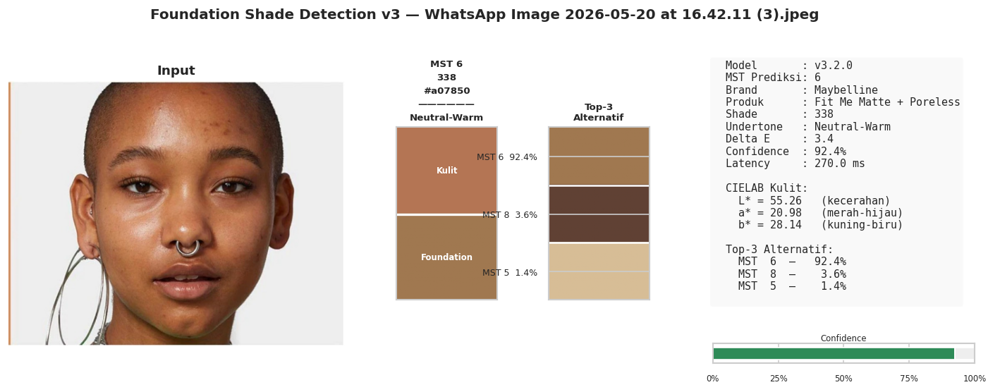

✅ Disimpan: /content/result_v3_WhatsApp Image 2026-05-20 at 16.42.11 (3).jpeg.png


In [ ]:
from google.colab import files
import matplotlib.gridspec as gridspec
from skimage.color import lab2rgb


def hex2rgb(hex_str):
    h = hex_str.lstrip('#')
    return tuple(int(h[i:i+2], 16)/255. for i in (0, 2, 4))

print('📁 Pilih foto wajah (PNG/JPG)...')
uploaded    = files.upload()
all_results = []

for filename, file_bytes in uploaded.items():
    nparr = np.frombuffer(file_bytes, np.uint8)
    img   = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
    img   = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w  = img.shape[:2]
    if max(h, w) > 512:
        scale = 512 / max(h, w)
        img   = cv2.resize(img, (int(w*scale), int(h*scale)))

    print(f'\n📸 {filename} | shape={img.shape}')
    result = detector.predict(img)

    if result['status'] == 'error':
        print(f'❌ {result["message"]}'); continue

    all_results.append({'filename': filename, **result})

    main_rgb = hex2rgb(result['hex_color'])

    fig = plt.figure(figsize=(15, 5))
    gs  = gridspec.GridSpec(1, 4, width_ratios=[3, 0.9, 0.9, 2.6], wspace=0.25)

    # Col 0: foto input
    ax0 = fig.add_subplot(gs[0])
    ax0.imshow(img)
    ax0.set_title('Input', fontweight='bold', fontsize=11)
    ax0.axis('off')

    # Col 1: shade utama
    ax1 = fig.add_subplot(gs[1])

    # Tampilkan dua swatch bertumpuk: warna kulit (atas) + warna foundation (bawah)
    def hex_to_rgb_float(hex_str):
        h = hex_str.lstrip('#')
        return [int(h[i:i+2], 16)/255. for i in (0, 2, 4)]

    def cielab_to_rgb_safe(L, a, b):
        lab = np.array([[[L, a, b]]], dtype=np.float64)
        rgb = lab2rgb(lab)[0, 0]
        return np.clip(rgb, 0, 1)

    skin_rgb  = cielab_to_rgb_safe(
        result['cielab']['L'],
        result['cielab']['a'],
        result['cielab']['b']
    )
    found_rgb = hex_to_rgb_float(result['hex_color'])  # ← warna foundation

    # Canvas: 60px warna kulit (atas) + 60px warna foundation (bawah)
    canvas1 = np.ones((120, 70, 3))
    canvas1[:60,  :] = skin_rgb   # atas = warna kulit terdeteksi
    canvas1[60:,  :] = found_rgb  # bawah = warna foundation rekomendasi

    ax1.imshow(canvas1)
    ax1.axhline(60, color='white', linewidth=2)  # garis pemisah

    # Label kiri (atas & bawah)
    ax1.text(35, 30,  'Kulit',       ha='center', va='center', fontsize=7,
             color='white', fontweight='bold')
    ax1.text(35, 90, 'Foundation', ha='center', va='center', fontsize=7,
             color='white', fontweight='bold')

    ax1.set_title(
        f'MST {result["mst_pred"]}\n{result["shade_name"]}\n'
        f'{result["hex_color"]}\n——————\n{result["undertone"]}',
        fontsize=8, fontweight='bold', linespacing=1.6
    )
    ax1.set_xticks([]); ax1.set_yticks([])

    # Col 2: top-3 swatch — FIX BUG #2: pakai field 'hex' dari top3_with_hex
    ax2    = fig.add_subplot(gs[2])
    seg    = 120 // 3
    canvas = np.zeros((120, 70, 3))
    for ti, t in enumerate(result['top3']):
        hex_c = t.get('hex', '#888888')  # ← langsung dari field 'hex', tidak perlu lookup top5_recs
        canvas[ti*seg:(ti+1)*seg, :] = hex2rgb(hex_c)
    ax2.imshow(canvas)
    ax2.set_title('Top-3\nAlternatif', fontsize=8, fontweight='bold')
    ax2.set_yticks([seg//2, seg + seg//2, 2*seg + seg//2])
    ax2.set_yticklabels([f'MST {t["mst"]}  {t["conf"]}%' for t in result['top3']], fontsize=7.5)
    ax2.set_xticks([])
    for sep in [seg, seg*2]:
        ax2.axhline(sep, color='white', linewidth=1.5)

    # Col 3: info detail
    ax3 = fig.add_subplot(gs[3])
    conf_val   = result['confidence'] / 100
    conf_color = '#2e8b57' if conf_val >= 0.6 else '#e07b39' if conf_val >= 0.4 else '#cc2222'

    info_lines = (
        f'  Model       : v{result["version"]}\n'
        f'  MST Prediksi: {result["mst_pred"]}\n'
        f'  Brand       : {result["brand"]}\n'
        f'  Produk      : {result["product"]}\n'
        f'  Shade       : {result["shade_name"]}\n'
        f'  Undertone   : {result["undertone"]}\n'
        f'  Delta E     : {result["delta_e"]}\n'
        f'  Confidence  : {result["confidence"]}%\n'
        f'  Latency     : {result["latency_ms"]} ms\n\n'
        f'  CIELAB Kulit:\n'
        f'    L* = {result["cielab"]["L"]:<6}  (kecerahan)\n'
        f'    a* = {result["cielab"]["a"]:<6}  (merah-hijau)\n'
        f'    b* = {result["cielab"]["b"]:<6}  (kuning-biru)\n\n'
        f'  Top-3 Alternatif:\n'
    )
    for t in result['top3']:
        info_lines += f'    MST {t["mst"]:2d}  —  {t["conf"]:5.1f}%\n'

    ax3.text(0.04, 0.97, info_lines, transform=ax3.transAxes,
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='#f8f8f8', alpha=0.85))

    bar_ax = ax3.inset_axes([0.04, 0.04, 0.9, 0.06])
    bar_ax.barh(0, conf_val, color=conf_color, height=0.6)
    bar_ax.barh(0, 1-conf_val, left=conf_val, color='#eeeeee', height=0.6)
    bar_ax.set_xlim(0,1); bar_ax.set_ylim(-0.5,0.5)
    bar_ax.set_xticks([0,0.25,0.5,0.75,1.0])
    bar_ax.set_xticklabels(['0%','25%','50%','75%','100%'], fontsize=7)
    bar_ax.set_yticks([]); bar_ax.set_title('Confidence', fontsize=7, pad=2)
    ax3.axis('off')

    plt.suptitle(f'Foundation Shade Detection v3 — {filename}',
                 fontsize=12, fontweight='bold')
    plt.savefig(f'/content/result_v3_{filename}.png', bbox_inches='tight', dpi=130)
    plt.show()
    print(f'✅ Disimpan: /content/result_v3_{filename}.png')